<a href="https://colab.research.google.com/github/DhekerKacem/FuturVisionTransport/blob/main/proof_of_concept.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

### **Développez une preuve de concept**

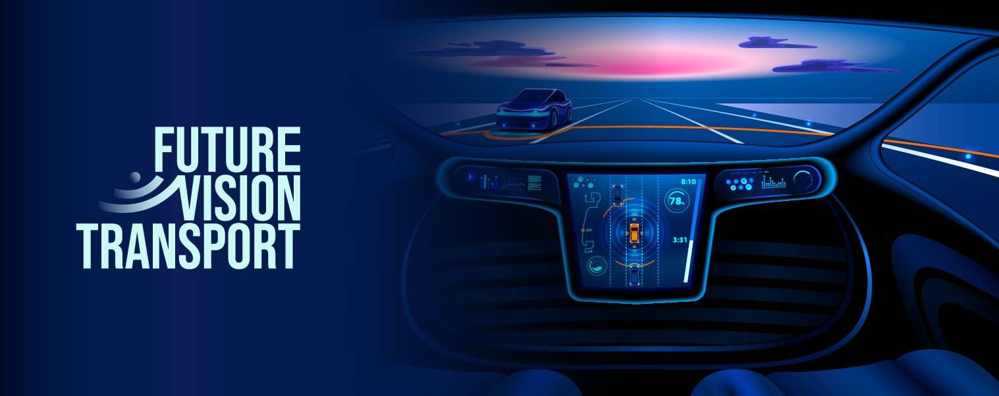


La segmentation sémantique occupe aujourd’hui une place très importante dans le domaine de la vision par ordinateur ou computer vision en anglais. Elle permet de classifier des images en attribuant une étiquette de classe à chaque pixel. Son objectif est de regrouper les pixels représentant des objets similaires et de leur accorder une catégorie prédéfinie. Elle trouve son application dans divers domaines dont la voiture autonome, la surveillance vidéo intelligente et les diagnostics médicaux précis. Le récent essor des réseaux de neurones convolutifs (CNN) a permis de réelles avancées dans le domaine de la segmentation sémantique d’images. Des modèles comme U-Net ou VGG16 ont permis d’atteindre des performances sans précédent. Mais les CNN, bien que performants, présentent plusieurs faiblesses dont la dépendance aux données massives, leur incapacité à capturer le contexte global et un besoin important en termes de puissance de calcul. C’est dans ce cadre que les Transformers ont fait leur entrée dans ce domaine. En effet, leur capacité de modélisation des dépendances de longue portée et leur légèreté relativement aux CNN ont fait d’eux un outil de choix dans les tâches de segmentation sémantique.
Dans ce papier, nous proposons une étude comparative entre un modèle U-Net Mini qui nous sert de baseline et un SegFormer qui est considéré comme le state of the art des modèles de segmentation sémantique. Le SegFormer est un modèle qui s’appuie sur l’architecture Transformers.
 Pour les besoins de cette étude, nous utilisons les modèles pré entrainés « Nvidia/segformer-b0-finetuned-cityscapes-1024-1024 » pré entrainé sur les données Cityscapes et le « Nvidia/segformer-b0-finetuned-ade-512-512 » pré entrainé sur les données ADE20K.

In [ ]:
pip install datasets


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 542.1/542.1 kB 6.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 116.3/116.3 kB 7.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 64.9/64.9 kB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 194.1/194.1 kB 8.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 9.5 MB/s eta 0:00:00
  Attempting uninstall: requests
    Found existing installation: requests 2.31.0
    Uninstalling requests-2.31.0:
      Successfully uninstalled requests-2.31.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests==2.31.0, but you have requests 2.32.3 which is incompatible.


In [ ]:
pip install transformers

In [ ]:
pip install imgaug

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Wed Jun 12 09:55:12 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   75C    P0              36W /  72W |  22645MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors
import cv2
import random
import imgaug as ia
from imgaug import augmenters as iaa
from imgaug.augmentables.segmaps import SegmentationMapsOnImage
import tensorflow as tf
from tensorflow.keras.utils import Sequence, to_categorical
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Dropout, Conv2DTranspose, Lambda
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping
from tensorflow.keras.layers import Dropout
from tensorflow.keras import backend as K
from PIL import Image
from transformers import SegformerFeatureExtractor
from transformers import TrainingArguments, Trainer
from datasets import load_metric
import torch
from torch.utils.data import Dataset
from torch.utils.data import DataLoader
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation, TrainingArguments, Trainer, EarlyStoppingCallback
from datasets import load_metric
import torch.nn.functional as F

### Définition de la métrique personnalisée

La métrique retenue pour le présent projet est « Intersection Over Union » (IoU). Cette métrique est utilisée essentiellement dans des tâches de segmentation d’image, celle-ci sert à évaluer la similitude entre deux ensembles. Plus précisément, cette métrique mesure la similitude spatiale entre les prédictions et les étiquettes réelles. Elle prend en compte aussi bien les pixels correctement prédits que ceux mal prédits.
Contrairement à l’accuracy, l’IoU prend en compte les faux positifs et les faux négatifs ce qui la rend très robuste et davantage informative pour évaluer les performances de modèles de segmentation sémantique surtout dans un contexte de déséquilibre de classe ce qui est le cas de nos données pour le présent projet.
Cette métrique que j’ai nommée ‘CustomMeanIoU’ a été sérialisée afin qu’elle soit sauvegardée avec le modèle et pour que celui-ci puisse être chargé et réutilisé sans problèmes.

In [ ]:
import tensorflow as tf
from tensorflow.keras import backend as K
import keras

# Enregistre la classe comme sérialisable pour Keras.
@keras.saving.register_keras_serializable(package="MyMetrics")
class CustomMeanIoU(tf.keras.metrics.Metric):
    def __init__(self, num_classes=8, name='mean_iou', **kwargs):
        # Appelle le constructeur de la classe parente (Metric) avec le nom et les arguments supplémentaires.
        super(CustomMeanIoU, self).__init__(name=name, **kwargs)
        # Définit le nombre de classes à évaluer.
        self.num_classes = num_classes
        # Initialise un poids pour accumuler la somme des IoU.
        self.total_iou = self.add_weight(name='total_iou', initializer='zeros')
        # Initialise un poids pour compter le nombre de classes valides.
        self.count_classes = self.add_weight(name='count_classes', initializer='zeros')

    def update_state(self, y_true, y_pred, sample_weight=None):
        # Si les tenseurs ont 4 dimensions, applique tf.argmax pour obtenir les labels de classes.
        if len(y_true.shape) == 4:
            y_true = tf.argmax(y_true, axis=-1)
            y_pred = tf.argmax(y_pred, axis=-1)

        # Initialise les variables pour la somme des IoU et le nombre de classes valides.
        mean_iou = 0.0
        class_count = 0.0

        # Boucle sur chaque classe pour calculer l'IoU.
        for i in range(self.num_classes):
            # Crée des masques pour les pixels de la classe i dans les vérités terrain et les prédictions.
            true_class = tf.cast(tf.equal(y_true, i), dtype=tf.float32)
            pred_class = tf.cast(tf.equal(y_pred, i), dtype=tf.float32)

            # Calcule l'intersection des prédictions et des vérités terrain.
            intersection = tf.reduce_sum(true_class * pred_class)
            # Calcule l'union des prédictions et des vérités terrain.
            union = tf.reduce_sum(true_class) + tf.reduce_sum(pred_class) - intersection

            # Calcule l'IoU pour la classe i.
            iou = intersection / (union + K.epsilon())
            # Vérifie si l'union est nulle (pour éviter la division par zéro).
            condition = tf.equal(union, 0)
            # Ajoute l'IoU calculé à la somme des IoU, sauf si l'union est nulle.
            mean_iou = tf.where(condition, mean_iou, mean_iou + iou)
            # Incrémente le compteur de classes valides sauf si l'union est nulle.
            class_count = tf.where(condition, class_count, class_count + 1)

        # Met à jour les poids totaux avec la somme des IoU et le nombre de classes valides.
        self.total_iou.assign_add(mean_iou)
        self.count_classes.assign_add(class_count)

    def result(self):
        # Retourne l'IoU moyen en divisant la somme des IoU par le nombre de classes valides.
        return self.total_iou / (self.count_classes + K.epsilon())

    def reset_state(self):
        # Réinitialise les poids total_iou et count_classes à zéro pour une nouvelle époque.
        self.total_iou.assign(0.0)
        self.count_classes.assign(0.0)

    def get_config(self):
        # Récupère la configuration de la classe parente.
        config = super(CustomMeanIoU, self).get_config()
        # Ajoute le nombre de classes à la configuration.
        config.update({
            'num_classes': self.num_classes,
        })
        # Retourne la configuration mise à jour.
        return config

    @classmethod
    def from_config(cls, config):
        # Crée une instance de la classe à partir de la configuration.
        return cls(**config)

#### Générateur de données

Un data generator est une fonction en machine learning qui génère des lots ou batches de données de façon itérative et sur demande. Il est utilisé lors de l’entrainement de modèles et particulièrement lorsque l’on est en présence d’un grand volume de données ce qui pourrait poser nombre de contraintes au niveau de la mémoire. Le data generator génère des échantillons de données avec leur étiquettes (labels) sans passer par le stockage sur le RAM. Il permet en outre une gestion à la volée en ce sens où il permet de réaliser des opérations de prétraitement en temps réel telles que notamment l’augmentation des images.
Pour les besoins du projet, nous avons créé deux générateurs de données. Le premier sert à charger et préparer des lots d’images et de masques. Pour ce faire, ce générateur incorpore une fonction pour récupérer les chemins d’images et de masques à partir de répertoires définis. Cela nous permet de générer des données d’entrainement, de validation et de test.
Un deuxième générateur qui reproduit le même schéma mais incorpore, en plus, une fonction pour augmenter les images en appliquant un certain nombre de transformations telles que la rotation aléatoire, l’ajustement du contraste gamma ou l’ajout de bruit gaussien.
Le but derrière l’augmentation c’est d’avoir plus de données pour l’entrainement et ce afin d’améliorer l’apprentissage de notre modèle de segmentation sémantique.
Nos modèles seront, ainsi, entrainés à deux reprises, une première sans augmentation et une deuxième avec augmentation.

#### Générateur sans augmentation

In [ ]:
class DataLoadGeneratorSA(Sequence):
    CATS = {
        'void': [0, 1, 2, 3, 4, 5, 6],
        'flat': [7, 8, 9, 10],
        'construction': [11, 12, 13, 14, 15, 16],
        'object': [17, 18, 19, 20],
        'nature': [21, 22],
        'sky': [23],
        'human': [24, 25],
        'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]
    }

    def __init__(self, image_paths, mask_paths, crop_x, crop_y, batch_size, shuffle=True):

        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.crop_x = crop_x
        self.crop_y = crop_y
        self.batch_size = batch_size
        self.shuffle = shuffle
        self.on_epoch_end()

    def __len__(self):
        return int(np.ceil(len(self.image_paths) / self.batch_size))

    def on_epoch_end(self):
        self.indexes = np.arange(len(self.image_paths))
        if self.shuffle:
            np.random.shuffle(self.indexes)

    def __getitem__(self, idx):
        batch_x = self.image_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        batch_y = self.mask_paths[idx * self.batch_size:(idx + 1) * self.batch_size]
        x, y = self._prepare_data(batch_x, batch_y)
        return x, y

    def _prepare_data(self, image_paths, mask_paths):
        x = []
        y = []
        for img_path, mask_path in zip(image_paths, mask_paths):
            img, mask = self._get_image_and_mask(img_path, mask_path)
            x.append(img)
            y.append(mask)
        x = np.array(x, dtype=np.float32) / 255.0
        y = np.array(y, dtype=np.uint8)
        y = np.expand_dims(y, axis=-1)
        y = to_categorical(y, num_classes=8)
        return x, y

    def _get_image_and_mask(self, img_path, mask_path):
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (self.crop_x, self.crop_y))
        mask = cv2.resize(mask, (self.crop_x, self.crop_y), interpolation=cv2.INTER_NEAREST)
        mask = self._convert_mask(mask)
        return img, mask

    def _convert_mask(self, img):
        mask = np.zeros((img.shape[0], img.shape[1], 8), dtype=np.uint8)
        for i in range(-1, 34):
            if i in self.CATS['void']:
                mask[:, :, 0] = np.logical_or(mask[:, :, 0], (img == i))
            elif i in self.CATS['flat']:
                mask[:, :, 1] = np.logical_or(mask[:, :, 1], (img == i))
            elif i in self.CATS['construction']:
                mask[:, :, 2] = np.logical_or(mask[:, :, 2], (img == i))
            elif i in self.CATS['object']:
                mask[:, :, 3] = np.logical_or(mask[:, :, 3], (img == i))
            elif i in self.CATS['nature']:
                mask[:, :, 4] = np.logical_or(mask[:, :, 4], (img == i))
            elif i in self.CATS['sky']:
                mask[:, :, 5] = np.logical_or(mask[:, :, 5], (img == i))
            elif i in self.CATS['human']:
                mask[:, :, 6] = np.logical_or(mask[:, :, 6], (img == i))
            elif i in self.CATS['vehicle']:
                mask[:, :, 7] = np.logical_or(mask[:, :, 7], (img == i))
        return np.argmax(mask, axis=2).astype('uint8')

# Fonction pour obtenir les chemins des images et des masques
def get_image_and_mask_paths(image_base_dir, mask_base_dir):
    cities = os.listdir(image_base_dir)
    image_paths = []
    mask_paths = []
    for city in cities:
        city_image_dir = os.path.join(image_base_dir, city)
        city_mask_dir = os.path.join(mask_base_dir, city)
        images = os.listdir(city_image_dir)
        for img in images:
            mask = img.replace('_leftImg8bit.png', '_gtFine_labelIds.png')
            mask_path = os.path.join(city_mask_dir, mask)
            if os.path.exists(mask_path):
                image_paths.append(os.path.join(city_image_dir, img))
                mask_paths.append(mask_path)
            else:
                print(f"Mask not found for image: {img}")
    print(f"Total images loaded from {image_base_dir}: {len(image_paths)}")
    print(f"Total masks loaded from {mask_base_dir}: {len(mask_paths)}")
    return image_paths, mask_paths

# Obtenir les chemins pour l'entraînement
train_image_base_dir = '/content/drive/My Drive//data/leftImg8bit/train'
train_mask_base_dir = '/content/drive/My Drive//data/gtFine/train'
train_image_paths, train_mask_paths = get_image_and_mask_paths(train_image_base_dir, train_mask_base_dir)

# Obtenir les chemins pour la validation
val_image_base_dir = '/content/drive/My Drive//data/leftImg8bit/val'
val_mask_base_dir = '/content/drive/My Drive//data/gtFine/val'
val_image_paths, val_mask_paths = get_image_and_mask_paths(val_image_base_dir, val_mask_base_dir)

# Obtenir les chemins pour le test
test_image_base_dir = '/content/drive/My Drive/data/leftImg8bit/test'
test_mask_base_dir = '/content/drive/My Drive//data/gtFine/test'
test_image_paths, test_mask_paths = get_image_and_mask_paths(test_image_base_dir, test_mask_base_dir)

# Création des DataLoaders sans augmentation
train_loaderSA = DataLoadGeneratorSA(train_image_paths, train_mask_paths, crop_x=512, crop_y=512, batch_size=8, shuffle=True)
val_loaderSA = DataLoadGeneratorSA(val_image_paths, val_mask_paths, crop_x=512, crop_y=512, batch_size=8, shuffle=False)
test_loaderSA = DataLoadGeneratorSA(test_image_paths, test_mask_paths, crop_x=512, crop_y=512, batch_size=8, shuffle=False)

print(f"Total batches in train_loader: {len(train_loaderSA)}")
print(f"Total batches in val_loader: {len(val_loaderSA)}")
print(f"Total batches in test_loader: {len(test_loaderSA)}")

# Pour tester un lot de données d'entraînement et afficher la forme du masque d'origine :
x_train_SA, y_train_SA = train_loaderSA[0]
print(x_train_SA.shape, y_train_SA.shape)  # Affiche la forme des lots de données générés

# Pour tester un lot de données de validation :
x_val_SA, y_val_SA = val_loaderSA[0]
print(x_val_SA.shape, y_val_SA.shape)  # Affiche la forme des lots de données générés

# Pour tester un lot de données de test :
x_test_SA, y_test_SA = test_loaderSA[0]
print(x_test_SA.shape, y_test_SA.shape)  # Affiche la forme des lots de données générés

Total images loaded from /content/drive/My Drive//data/leftImg8bit/train: 2975
Total masks loaded from /content/drive/My Drive//data/gtFine/train: 2975
Total images loaded from /content/drive/My Drive//data/leftImg8bit/val: 500
Total masks loaded from /content/drive/My Drive//data/gtFine/val: 500
Total images loaded from /content/drive/My Drive/data/leftImg8bit/test: 1525
Total masks loaded from /content/drive/My Drive//data/gtFine/test: 1525
Total batches in train_loader: 372
Total batches in val_loader: 63
Total batches in test_loader: 191
(8, 512, 512, 3) (8, 512, 512, 8)
(8, 512, 512, 3) (8, 512, 512, 8)
(8, 512, 512, 3) (8, 512, 512, 8)


### Création du répertoire de sauvegarde

In [ ]:
# Définir le répertoire de sauvegarde sur Google Drive
save_dir = '/content/drive/My Drive/models'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

### Modèle U-Net Mini

Le modèle U-Net Mini qui devait nous servir de base line pour notre projet de segmentation sémantique est une version simplifiée et allégée du modèle U-Net. Il est conçu pour des applications où les capacités de calcul sont limitées ou lorsque l’on souhaite, pour diverses raisons, avoir un modèle moins complexe.

Le modèle U-Net a, initialement, été développé par un ensemble de chercheurs en 2015 pour la segmentation d’images médicales. Il est, par la suite, devenu l’un des réseaux de neurones le plus utilisé pour la segmentation d’image.
Sans entrer dans les détails, il s’agit d’un modèle dit encodeur/décodeur. Dans un premier temps, le réseau contracte l’image d’entrée spatialement tout en augmentant la profondeur des caractéristiques grâce à des couches de convolution et de pooling. Cette première partie est l’étape encodage ou contracting path.  Dans un deuxième temps, le réseau reconstruit l’image à la résolution d’origine en utilisant des couches d’upsampling ou convolution transposée et de skip connections, c’est l’étape décodage ou expanding path.
Le modèle U-Net Mini est très efficace sur des tâches de segmentation sémantique tout en étant moins gourmand en ressources, plus simple à l’usage et plus adaptable.

#### Modèle Mini_Unet sans augmentation

In [ ]:
# Définition du modèle Mini U-Net
def mini_unet(input_size=(512, 512, 3), n_classes=8):
    inputs = Input(input_size)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
    conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv1)
    pool1 = MaxPooling2D(pool_size=(2, 2))(conv1)

    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(pool1)
    conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv2)
    pool2 = MaxPooling2D(pool_size=(2, 2))(conv2)

    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(pool2)
    conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv3)
    pool3 = MaxPooling2D(pool_size=(2, 2))(conv3)

    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool3)
    conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv4)

    up1 = concatenate([UpSampling2D(size=(2, 2))(conv4), conv3], axis=-1)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(up1)
    conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv5)

    up2 = concatenate([UpSampling2D(size=(2, 2))(conv5), conv2], axis=-1)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up2)
    conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv6)

    up3 = concatenate([UpSampling2D(size=(2, 2))(conv6), conv1], axis=-1)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(up3)
    conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv7)

    output = Conv2D(n_classes, (1, 1), activation='softmax')(conv7)

    model = Model(inputs=inputs, outputs=output)
    return model

# Créer le modèle avec input_size = (512, 512, 3)
model_p9 = mini_unet(input_size=(512, 512, 3), n_classes=8)
model_p9.compile(optimizer=Adam(), loss='categorical_crossentropy', metrics=[CustomMeanIoU(num_classes=8)])

# Chemin complet pour enregistrer le modèle complet au format HDF5
model_filepath_unet_p9_complete_h5 = os.path.join(save_dir, 'mini_unet_p9_complete.h5')

# Définir les callbacks
early_stopping_p9 = EarlyStopping(monitor='val_loss', patience=4)
model_checkpoint_p9 = ModelCheckpoint(model_filepath_unet_p9_complete_h5, monitor='val_loss', save_best_only=True, save_weights_only=False)

In [ ]:
model_p9.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 512, 512, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 512, 512, 64)         1792      ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, 512, 512, 64)         36928     ['conv2d[0][0]']              
                                                                                                  
 max_pooling2d (MaxPooling2  (None, 256, 256, 64)         0         ['conv2d_1[0][0]']            
 D)                                                                                           

In [ ]:
import gc
gc.collect()

4132

In [ ]:
tf.keras.backend.clear_session()

In [ ]:
!nvidia-smi

Wed Jun 12 09:55:28 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA L4                      Off | 00000000:00:03.0 Off |                    0 |
| N/A   76C    P0              36W /  72W |  22645MiB / 23034MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
steps_per_epoch = len(train_loaderSA)
validation_steps = len(val_loaderSA)

# Démarrer l'entraînement du modèle
history = model_p9.fit(
    train_loaderSA,
    workers=30,
    steps_per_epoch=steps_per_epoch,
    validation_data=val_loaderSA,
    validation_steps=validation_steps,
    epochs=20,
    callbacks=[early_stopping_p9, model_checkpoint_p9]
)

Epoch 1/20
372/372 [==============================] - ETA: 0s - loss: 1.1599 - mean_iou: 0.2452

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


372/372 [==============================] - 1196s 3s/step - loss: 1.1599 - mean_iou: 0.2452 - val_loss: 0.8676 - val_mean_iou: 0.3756
Epoch 2/20
372/372 [==============================] - 628s 2s/step - loss: 0.7187 - mean_iou: 0.4342 - val_loss: 0.6631 - val_mean_iou: 0.4481
Epoch 3/20
372/372 [==============================] - 632s 2s/step - loss: 0.6427 - mean_iou: 0.4723 - val_loss: 0.5847 - val_mean_iou: 0.4948
Epoch 4/20
372/372 [==============================] - 628s 2s/step - loss: 0.5087 - mean_iou: 0.5357 - val_loss: 0.5472 - val_mean_iou: 0.5184
Epoch 5/20
372/372 [==============================] - 628s 2s/step - loss: 0.4541 - mean_iou: 0.5680 - val_loss: 0.4700 - val_mean_iou: 0.5713
Epoch 6/20
372/372 [==============================] - 628s 2s/step - loss: 0.4208 - mean_iou: 0.5917 - val_loss: 0.4542 - val_mean_iou: 0.5962
Epoch 7/20
372/372 [==============================] - 628s 2s/step - loss: 0.3943 - mean_iou: 0.6123 - val_loss: 0.4250 - val_mean_iou: 0.6074
Epoch 8/2

### Inférences U-Net Mini

In [ ]:
from tensorflow.keras.models import Model, load_model

model_filepath_unet_p9_complete_h5 = os.path.join(save_dir, 'mini_unet_p9_complete.h5')

# Charger le modèle entrainé
model_p9 = load_model(model_filepath_unet_p9_complete_h5, custom_objects={'CustomMeanIoU': CustomMeanIoU})

In [ ]:
# Effectuer des prédictions sur les données de test par lots
all_predictions = []

# Itérer à travers les lots de données du DataLoader
for x_test, y_test in test_loaderSA:
    predictions = model_p9.predict(x_test)  # Désactiver les messages de progression
    all_predictions.append(predictions)

# Convertir les prédictions en étiquettes de classes
all_predictions = np.concatenate(all_predictions, axis=0)
predicted_classes = np.argmax(all_predictions, axis=-1)

# Afficher les formes pour vérifier
print("Forme des prédictions :", all_predictions.shape)
print("Forme des classes prédites :", predicted_classes.shape)

1/1 [==============================] - 5s 5s/step
Forme des prédictions : (1525, 512, 512, 8)
Forme des classes prédites : (1525, 512, 512)


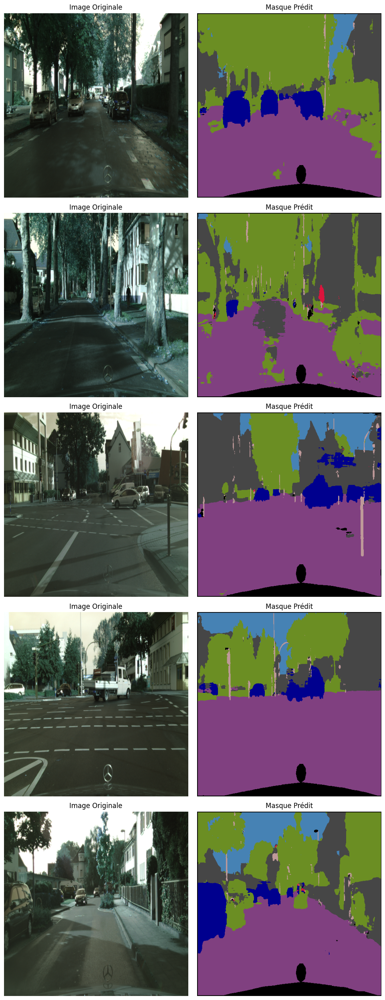

In [ ]:
# Définir une palette de couleurs pour chaque classe
PALETTE = np.array([
    [0, 0, 0],        # void
    [128, 64, 128],   # flat
    [70, 70, 70],     # construction
    [190, 153, 153],  # object
    [107, 142, 35],   # nature
    [70, 130, 180],   # sky
    [220, 20, 60],    # human
    [0, 0, 142]       # vehicle
])

# Convertir les masques en couleur
def convert_mask_to_color(mask):
    color_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i in range(8):
        color_mask[mask == i] = PALETTE[i]
    return color_mask

# Visualiser des exemples d'images avec leurs masques correspondants
def visualize_predictions(images, predictions, num_examples=5):
    fig, axes = plt.subplots(num_examples, 2, figsize=(10, num_examples * 5))
    axes = axes.ravel()

    for i in range(num_examples):
        # Charger l'image
        img = images[i]
        pred_mask = convert_mask_to_color(predictions[i])

        # Afficher l'image originale
        axes[2*i].imshow(img)
        axes[2*i].set_title("Image Originale")
        axes[2*i].axis('off')

        # Afficher le masque prédit
        axes[2*i + 1].imshow(pred_mask)
        axes[2*i + 1].set_title("Masque Prédit")
        axes[2*i + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualiser les prédictions
visualize_predictions(x_test_SA, predicted_classes, num_examples=5)

### Entrainement d'un SegFormer pré entrainé

Présentation de SegFormer

#### Data generator pour SegFormer("nvidia/segformer-b0-finetuned-ade-512-512")

In [ ]:
import os
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

class CityscapesDataset(Dataset):
    CATS = {
        'void': [0, 1, 2, 3, 4, 5, 6],
        'flat': [7, 8, 9, 10],
        'construction': [11, 12, 13, 14, 15, 16],
        'object': [17, 18, 19, 20],
        'nature': [21, 22],
        'sky': [23],
        'human': [24, 25],
        'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]
    }

    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]
        img, mask = self._get_image_and_mask(img_path, mask_path)

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']

        # Normaliser l'image
        img = img.astype(np.float32) / 255.0
        img = img.transpose(2, 0, 1)  # Convertir de HWC à CHW

        # Convertir l'image et le masque en tenseur PyTorch
        img = torch.tensor(img, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.long)

        return {"pixel_values": img, "labels": mask}

    def _get_image_and_mask(self, img_path, mask_path):
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (512, 512))
        mask = cv2.resize(mask, (512, 512), interpolation=cv2.INTER_NEAREST)
        mask = self._convert_mask(mask)
        return img, mask

    def _convert_mask(self, img):
        mask = np.zeros((img.shape[0], img.shape[1], 8), dtype=np.uint8)
        for i in range(-1, 34):
            if i in self.CATS['void']:
                mask[:, :, 0] = np.logical_or(mask[:, :, 0], (img == i))
            elif i in self.CATS['flat']:
                mask[:, :, 1] = np.logical_or(mask[:, :, 1], (img == i))
            elif i in self.CATS['construction']:
                mask[:, :, 2] = np.logical_or(mask[:, :, 2], (img == i))
            elif i in self.CATS['object']:
                mask[:, :, 3] = np.logical_or(mask[:, :, 3], (img == i))
            elif i in self.CATS['nature']:
                mask[:, :, 4] = np.logical_or(mask[:, :, 4], (img == i))
            elif i in self.CATS['sky']:
                mask[:, :, 5] = np.logical_or(mask[:, :, 5], (img == i))
            elif i in self.CATS['human']:
                mask[:, :, 6] = np.logical_or(mask[:, :, 6], (img == i))
            elif i in self.CATS['vehicle']:
                mask[:, :, 7] = np.logical_or(mask[:, :, 7], (img == i))
        return np.argmax(mask, axis=2).astype('uint8')

# Fonction pour obtenir les chemins des images et des masques
def get_image_and_mask_paths(image_base_dir, mask_base_dir):
    cities = os.listdir(image_base_dir)
    image_paths = []
    mask_paths = []
    for city in cities:
        city_image_dir = os.path.join(image_base_dir, city)
        city_mask_dir = os.path.join(mask_base_dir, city)
        images = os.listdir(city_image_dir)
        for img in images:
            mask = img.replace('_leftImg8bit.png', '_gtFine_labelIds.png')
            mask_path = os.path.join(city_mask_dir, mask)
            if os.path.exists(mask_path):
                image_paths.append(os.path.join(city_image_dir, img))
                mask_paths.append(mask_path)
            else:
                print(f"Mask not found for image: {img}")
    print(f"Total images loaded from {image_base_dir}: {len(image_paths)}")
    print(f"Total masks loaded from {mask_base_dir}: {len(mask_paths)}")
    return image_paths, mask_paths

# Utiliser un modèle SegFormer disponible
model_name = "nvidia/segformer-b0-finetuned-ade-512-512"

# Obtenir les chemins des images et des masques
train_image_paths, train_mask_paths = get_image_and_mask_paths("/content/drive/My Drive/data/leftImg8bit/train", "/content/drive/My Drive/data/gtFine/train")

# Créer les datasets pour l'entraînement
train_dataset = CityscapesDataset(
    image_paths=train_image_paths,
    mask_paths=train_mask_paths,
)

# Obtenir les chemins des images et des masques pour la validation
val_image_paths, val_mask_paths = get_image_and_mask_paths("/content/drive/My Drive/data/leftImg8bit/val", "/content/drive/My Drive/data/gtFine/val")

# Créer les datasets pour la validation
val_dataset = CityscapesDataset(
    image_paths=val_image_paths,
    mask_paths=val_mask_paths,
)

# Obtenir les chemins des images et des masques pour le test
test_image_paths, test_mask_paths = get_image_and_mask_paths("/content/drive/My Drive/data/leftImg8bit/test", "/content/drive/My Drive/data/gtFine/test")

# Créer les datasets pour le test
test_dataset = CityscapesDataset(
    image_paths=test_image_paths,
    mask_paths=test_mask_paths,
)

# Créer les DataLoaders
train_loader = DataLoader(train_dataset, batch_size=8, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=8, shuffle=False)
test_loader = DataLoader(test_dataset, batch_size=8, shuffle=False)

# Pour tester un lot de données d'entraînement et afficher la forme du masque d'origine :
batch = next(iter(train_loader))
x_train_seg = batch["pixel_values"]
y_train_seg = batch["labels"]
print(x_train_seg.shape, y_train_seg.shape)  # Affiche la forme des lots de données générés

# Pour tester un lot de données de validation :
batch = next(iter(val_loader))
x_val_seg = batch["pixel_values"]
y_val_seg = batch["labels"]
print(x_val_seg.shape, y_val_seg.shape)  # Affiche la forme des lots de données générés

# Pour tester un lot de données de test :
batch = next(iter(test_loader))
x_test_seg = batch["pixel_values"]
y_test_seg = batch["labels"]
print(x_test_seg.shape, y_test_seg.shape)  # Affiche la forme des lots de données générés

Total images loaded from /content/drive/My Drive/data/leftImg8bit/train: 2975
Total masks loaded from /content/drive/My Drive/data/gtFine/train: 2975
Total images loaded from /content/drive/My Drive/data/leftImg8bit/val: 500
Total masks loaded from /content/drive/My Drive/data/gtFine/val: 500
Total images loaded from /content/drive/My Drive/data/leftImg8bit/test: 1525
Total masks loaded from /content/drive/My Drive/data/gtFine/test: 1525
torch.Size([8, 3, 512, 512]) torch.Size([8, 512, 512])
torch.Size([8, 3, 512, 512]) torch.Size([8, 512, 512])
torch.Size([8, 3, 512, 512]) torch.Size([8, 512, 512])


#### Data generator pour SegFormer("nvidia/segformer-b0-finetuned-cityscapes-1024-1024")

In [ ]:
import os
import numpy as np
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
from transformers import SegformerImageProcessor, SegformerForSemanticSegmentation

class CityscapesDatasetnd(Dataset):
    CATS = {
        'void': [0, 1, 2, 3, 4, 5, 6],
        'flat': [7, 8, 9, 10],
        'construction': [11, 12, 13, 14, 15, 16],
        'object': [17, 18, 19, 20],
        'nature': [21, 22],
        'sky': [23],
        'human': [24, 25],
        'vehicle': [26, 27, 28, 29, 30, 31, 32, 33, -1]
    }

    def __init__(self, image_paths, mask_paths, transform=None):
        self.image_paths = image_paths
        self.mask_paths = mask_paths
        self.transform = transform

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        img_path = self.image_paths[idx]
        mask_path = self.mask_paths[idx]
        img, mask = self._get_image_and_mask(img_path, mask_path)

        if self.transform:
            augmented = self.transform(image=img, mask=mask)
            img = augmented['image']
            mask = augmented['mask']

        # Normaliser l'image
        img = img.astype(np.float32) / 255.0
        img = img.transpose(2, 0, 1)  # Convertir de HWC à CHW

        # Convertir l'image et le masque en tenseur PyTorch
        img = torch.tensor(img, dtype=torch.float32)
        mask = torch.tensor(mask, dtype=torch.long)

        return {"pixel_values": img, "labels": mask}

    def _get_image_and_mask(self, img_path, mask_path):
        img = cv2.imread(img_path)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        img = cv2.resize(img, (1024, 1024))
        mask = cv2.resize(mask, (1024, 1024), interpolation=cv2.INTER_NEAREST)
        mask = self._convert_mask(mask)
        return img, mask

    def _convert_mask(self, img):
        mask = np.zeros((img.shape[0], img.shape[1], 8), dtype=np.uint8)
        for i in range(-1, 34):
            if i in self.CATS['void']:
                mask[:, :, 0] = np.logical_or(mask[:, :, 0], (img == i))
            elif i in self.CATS['flat']:
                mask[:, :, 1] = np.logical_or(mask[:, :, 1], (img == i))
            elif i in self.CATS['construction']:
                mask[:, :, 2] = np.logical_or(mask[:, :, 2], (img == i))
            elif i in self.CATS['object']:
                mask[:, :, 3] = np.logical_or(mask[:, :, 3], (img == i))
            elif i in self.CATS['nature']:
                mask[:, :, 4] = np.logical_or(mask[:, :, 4], (img == i))
            elif i in self.CATS['sky']:
                mask[:, :, 5] = np.logical_or(mask[:, :, 5], (img == i))
            elif i in self.CATS['human']:
                mask[:, :, 6] = np.logical_or(mask[:, :, 6], (img == i))
            elif i in self.CATS['vehicle']:
                mask[:, :, 7] = np.logical_or(mask[:, :, 7], (img == i))
        return np.argmax(mask, axis=2).astype('uint8')

# Fonction pour obtenir les chemins des images et des masques
def get_image_and_mask_paths(image_base_dir, mask_base_dir):
    cities = os.listdir(image_base_dir)
    image_paths = []
    mask_paths = []
    for city in cities:
        city_image_dir = os.path.join(image_base_dir, city)
        city_mask_dir = os.path.join(mask_base_dir, city)
        images = os.listdir(city_image_dir)
        for img in images:
            mask = img.replace('_leftImg8bit.png', '_gtFine_labelIds.png')
            mask_path = os.path.join(city_mask_dir, mask)
            if os.path.exists(mask_path):
                image_paths.append(os.path.join(city_image_dir, img))
                mask_paths.append(mask_path)
            else:
                print(f"Mask not found for image: {img}")
    print(f"Total images loaded from {image_base_dir}: {len(image_paths)}")
    print(f"Total masks loaded from {mask_base_dir}: {len(mask_paths)}")
    return image_paths, mask_paths

# Utiliser un modèle SegFormer disponible
model_name_nd = "nvidia/segformer-b0-finetuned-cityscapes-1024-1024"


# Obtenir les chemins des images et des masques
train_image_paths, train_mask_paths = get_image_and_mask_paths("/content/drive/My Drive/data/leftImg8bit/train", "/content/drive/My Drive/data/gtFine/train")

# Créer les datasets pour l'entraînement
train_dataset_nd = CityscapesDatasetnd(
    image_paths=train_image_paths,
    mask_paths=train_mask_paths,
)

# Obtenir les chemins des images et des masques pour la validation
val_image_paths, val_mask_paths = get_image_and_mask_paths("/content/drive/My Drive/data/leftImg8bit/val", "/content/drive/My Drive/data/gtFine/val")

# Créer les datasets pour la validation
val_dataset_nd = CityscapesDatasetnd(
    image_paths=val_image_paths,
    mask_paths=val_mask_paths,
)

# Obtenir les chemins des images et des masques pour le test
test_image_paths, test_mask_paths = get_image_and_mask_paths("/content/drive/My Drive/data/leftImg8bit/test", "/content/drive/My Drive/data/gtFine/test")

# Créer les datasets pour le test
test_dataset_nd = CityscapesDatasetnd(
    image_paths=test_image_paths,
    mask_paths=test_mask_paths,
)

# Créer les DataLoaders
train_loader_nd = DataLoader(train_dataset_nd, batch_size=8, shuffle=True)
val_loader_nd = DataLoader(val_dataset_nd, batch_size=8, shuffle=False)
test_loader_nd = DataLoader(test_dataset_nd, batch_size=8, shuffle=False)

# Pour tester un lot de données d'entraînement et afficher la forme du masque d'origine :
batch = next(iter(train_loader_nd))
x_train_seg_nd = batch["pixel_values"]
y_train_seg_nd = batch["labels"]
print(x_train_seg_nd.shape, y_train_seg_nd.shape)  # Affiche la forme des lots de données générés

# Pour tester un lot de données de validation :
batch = next(iter(val_loader_nd))
x_val_seg_nd = batch["pixel_values"]
y_val_seg_nd = batch["labels"]
print(x_val_seg_nd.shape, y_val_seg_nd.shape)  # Affiche la forme des lots de données générés

# Pour tester un lot de données de test :
batch = next(iter(test_loader_nd))
x_test_seg_nd = batch["pixel_values"]
y_test_seg_nd = batch["labels"]
print(x_test_seg_nd.shape, y_test_seg_nd.shape)  # Affiche la forme des lots de données générés

Total images loaded from /content/drive/My Drive/data/leftImg8bit/train: 2975
Total masks loaded from /content/drive/My Drive/data/gtFine/train: 2975
Total images loaded from /content/drive/My Drive/data/leftImg8bit/val: 500
Total masks loaded from /content/drive/My Drive/data/gtFine/val: 500
Total images loaded from /content/drive/My Drive/data/leftImg8bit/test: 1525
Total masks loaded from /content/drive/My Drive/data/gtFine/test: 1525
torch.Size([8, 3, 1024, 1024]) torch.Size([8, 1024, 1024])
torch.Size([8, 3, 1024, 1024]) torch.Size([8, 1024, 1024])
torch.Size([8, 3, 1024, 1024]) torch.Size([8, 1024, 1024])


In [ ]:
pip install accelerate -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 309.4/309.4 kB 6.1 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-m

In [ ]:
pip install transformers[torch]

#### Entrainement de SegFormer pré entrainé

Le modèle SegFormer a été introduit en 2021 dans l’article « SegFormer : Simple and Efficient Design for Semantic Segmentation with Transformers » par Enze Xie, Wenhai Wang, Zhiding Yu, Anima Anandkumar, Jose M. Alvarez et Ping Luo.
Le modèle SegFormer combine une série d’innovations architecturales pour améliorer la segmentation sémantique. Le modèle se compose d’un encodeur basé sur une architecture Transformers hiérarchique et d’un décodeur MLP (Multilayers Perception) simple er léger. L’encodeur Transformer à structure pyramidale permet de traiter des caractéristiques à différentes échelles ce qui lui permet de détecter des détails fins mais également des contextes plus larges sans avoir recours au codage positionnel ce qui évite une baisse de performances due à une différence de résolution entre les données d’entrainement et de test. SegFormer intègre un simple décodeur MLP permettant de capturer, à la fois, l’attention locale et l’attention globale car il fusionne efficacement les informations des différentes couches de l’encodeur.  
Cette architecture permet de simplifier le processus de décodage offrant une meilleure efficience en termes de performances et d’économie de ressources.
Pour conclure sur cette partie, et sans entrer dans des détails mathématiques fastidieux, nous pouvons dire que le modèle SegFormer et ses différentes, en particulier, ceux développés par Nvidia et disponibles dans la bibliothèque Transformers de Hugging Face, sont, du moins en théorie, plus efficients car à la fois plus performants et plus économes que les réseaux de neurones convolutifs. Cette efficacité vient de la combinaison d’un encodeur se basant sur l’architecture Transformers et d’un décodeur MLP léger.

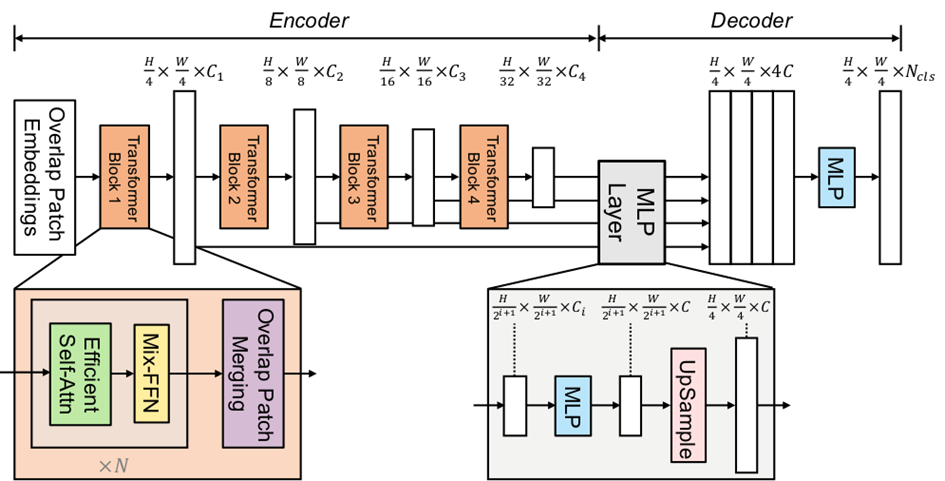

#### Entrainement du SegFormer("nvidia/segformer-b0-finetuned-cityscapes-1024-1024"), Version 1 avec des inputs de dimension: torch.Size(images [8, 3, 1024, 1024]) torch.Size(masques[8, 1024, 1024])


Le « Nvidia/segformer-b0-finetuned-cityscapes-1024-1024 » est un SegFormer B0 pré entrainé dans un premier temps sur le jeu de données ImageNet puis fine tuned sur les données Cityscapes pour la tâche de segmentation sémantique d’images urbaines.

In [ ]:
import gc
gc.collect()

24

In [ ]:
# Initialiser le modèle avec les poids pré-entraînés
model_essai = SegformerForSemanticSegmentation.from_pretrained(
    model_name_nd,
    num_labels=8,  # Nombre de classes pour votre tâche de segmentation
    ignore_mismatched_sizes=True
)

# Réinitialiser la couche de classification pour correspondre au nombre de classes
model_essai.decode_head.classifier = torch.nn.Conv2d(256, 8, kernel_size=1)
model_essai.decode_head.classifier.bias.data = torch.zeros(8)
model_essai.decode_head.classifier.weight.data = torch.nn.init.kaiming_normal_(torch.empty(8, 256, 1, 1))

# Définir le répertoire de sauvegarde
save_dir = '/content/drive/My Drive/model_segformer_essai'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Assurez-vous que le modèle est sur le GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cpu':
    raise ValueError("A GPU is required for this script.")

model_essai.to(device)

# Fonction de métrique pour l'entraînement
metric = load_metric("mean_iou", trust_remote_code=True)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(1)  # (batch_size, height, width)

    # Convertir les prédictions en tenseurs PyTorch
    preds = torch.tensor(preds, dtype=torch.float32)
    labels = torch.tensor(labels, dtype=torch.long)

    # Redimensionner les prédictions pour correspondre aux dimensions des labels
    preds = F.interpolate(preds.unsqueeze(1), size=(1024, 1024), mode='nearest').squeeze(1).long()

    # Assurez-vous que les dimensions correspondent
    labels = labels.squeeze()
    preds = preds.squeeze()

    print(f"Shape of predictions: {preds.shape}")
    print(f"Shape of labels: {labels.shape}")

    # Vérifier si les dimensions correspondent
    if preds.shape != labels.shape:
        raise ValueError(f"Shape mismatch: predictions {preds.shape}, labels {labels.shape}")

    mean_iou = metric.compute(predictions=preds.numpy(), references=labels.numpy(), num_labels=8, ignore_index=255)
    return {
        "mean_iou": mean_iou['mean_iou']
    }

# Configuration des arguments d'entraînement
training_args_essai = TrainingArguments(
    output_dir=save_dir,
    eval_strategy="epoch",
    save_strategy="epoch",
    logging_dir=os.path.join(save_dir, 'logs'),  # Définir le chemin du répertoire des logs
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=5,
    logging_steps=10,
    load_best_model_at_end=True,
    metric_for_best_model="mean_iou",
    save_total_limit=1,
    fp16=True,
    dataloader_num_workers=12,
    dataloader_pin_memory=True,
    warmup_steps=500,  # Ajout du nombre de pas de chauffe
    weight_decay=0.01  # Ajout de la décroissance du poids
)

# Initialiser le Trainer avec les callbacks
trainer_essai = Trainer(
    model=model_essai,
    args=training_args_essai,
    train_dataset=train_dataset_nd,
    eval_dataset=val_dataset_nd,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]  # Callback pour arrêt anticipé
)

# Entraîner le modèle
trainer_essai.train()

# Sauvegarder le modèle complet
model_essai.save_pretrained(save_dir)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-cityscapes-1024-1024 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([19, 256, 1, 1]) in the checkpoint and torch.Size([8, 256, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([19]) in the checkpoint and torch.Size([8]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Epoch,Training Loss,Validation Loss,Mean Iou
1,0.383700,0.414513,0.644959
2,0.285600,0.277721,0.738517
3,0.268000,0.252750,0.756418
4,0.213400,0.246211,0.762893
5,0.194900,0.245448,0.763970


Shape of predictions: torch.Size([500, 1024, 1024])
Shape of labels: torch.Size([500, 1024, 1024])


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 1024, 1024])
Shape of labels: torch.Size([500, 1024, 1024])


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 1024, 1024])
Shape of labels: torch.Size([500, 1024, 1024])


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 1024, 1024])
Shape of labels: torch.Size([500, 1024, 1024])


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 1024, 1024])
Shape of labels: torch.Size([500, 1024, 1024])


#### Entrainement du SegFormer("nvidia/segformer-b0-finetuned-cityscapes-1024-1024"), Version 2 avec des inputs de dimension: torch.Size(images [8, 3, 512, 512]) torch.Size(masques[8, 512, 512])

In [ ]:
# Initialiser le modèle avec les poids pré-entraînés
model_nd = SegformerForSemanticSegmentation.from_pretrained(
    model_name_nd,
    num_labels=8,  # Nombre de classes pour votre tâche de segmentation
    ignore_mismatched_sizes=True
)

# Réinitialiser la couche de classification pour correspondre au nombre de classes
model_nd.decode_head.classifier = torch.nn.Conv2d(256, 8, kernel_size=1)
model_nd.decode_head.classifier.bias.data = torch.zeros(8)
model_nd.decode_head.classifier.weight.data = torch.nn.init.kaiming_normal_(torch.empty(8, 256, 1, 1))

# Définir le répertoire de sauvegarde
save_dir = '/content/drive/My Drive/model_segformer'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Assurez-vous que le modèle est sur le GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cpu':
    raise ValueError("A GPU is required for this script.")

model_nd.to(device)

# Fonction de métrique pour l'entraînement
metric = load_metric("mean_iou", trust_remote_code=True)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(1)  # (batch_size, height, width)

    # Convertir les prédictions en tenseurs PyTorch
    preds = torch.tensor(preds, dtype=torch.float32)
    labels = torch.tensor(labels, dtype=torch.long)

    # Redimensionner les prédictions pour correspondre aux dimensions des labels
    preds = F.interpolate(preds.unsqueeze(1), size=(512, 512), mode='nearest').squeeze(1).long()

    # Assurez-vous que les dimensions correspondent
    labels = labels.squeeze()
    preds = preds.squeeze()

    print(f"Shape of predictions: {preds.shape}")
    print(f"Shape of labels: {labels.shape}")

    # Vérifier si les dimensions correspondent
    if preds.shape != labels.shape:
        raise ValueError(f"Shape mismatch: predictions {preds.shape}, labels {labels.shape}")

    mean_iou = metric.compute(predictions=preds.numpy(), references=labels.numpy(), num_labels=8, ignore_index=255)
    return {
        "mean_iou": mean_iou['mean_iou']
    }

# Configurer les arguments d'entraînement
training_args_nd = TrainingArguments(
    per_device_train_batch_size=8,
    per_device_eval_batch_size=8,
    num_train_epochs=5,
    eval_strategy="epoch",
    save_strategy="epoch",
    output_dir=save_dir,
    logging_dir='./logs',
    logging_steps=10,
    load_best_model_at_end=True,
    metric_for_best_model="mean_iou",
    save_total_limit=1,
    fp16=True,  # Utiliser la précision mixte
    dataloader_num_workers=12,
    dataloader_pin_memory=True
)

# Initialiser le Trainer avec les callbacks
trainer_nd = Trainer(
    model=model_nd,
    args=training_args_nd,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]  # Callback pour arrêt anticipé
)

# Entraîner le modèle
trainer_nd.train()

# Sauvegarder le modèle complet
model_nd.save_pretrained(save_dir)

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-cityscapes-1024-1024 and are newly initialized because the shapes did not match:
- decode_head.classifier.weight: found shape torch.Size([19, 256, 1, 1]) in the checkpoint and torch.Size([8, 256, 1, 1]) in the model instantiated
- decode_head.classifier.bias: found shape torch.Size([19]) in the checkpoint and torch.Size([8]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()
/usr/local/lib/python3.10/dist-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Des

Epoch,Training Loss,Validation Loss,Mean Iou
1,0.328500,0.360305,0.664580
2,0.319000,0.318103,0.691194
3,0.318700,0.309337,0.701292
4,0.251000,0.300709,0.704395


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


Epoch,Training Loss,Validation Loss,Mean Iou
1,0.328500,0.360305,0.664580
2,0.319000,0.318103,0.691194
3,0.318700,0.309337,0.701292
4,0.251000,0.300709,0.704395
5,0.241000,0.303681,0.705513


#### Entrainement du SegFormer « Nvidia/segformer-b0-finetuned-ade-512-512 »

Le « Nvidia/segformer-b0-finetuned-ade-512-512 » suit la même logique que le « Nvidia/segformer-b0-finetuned-cityscapes-1024-1024 »  mais a été fine tuned sur le jeu de données ADE20K.

In [ ]:
# Initialiser le modèle avec les poids pré-entraînés
model = SegformerForSemanticSegmentation.from_pretrained(
    model_name,
    num_labels=8,  # Nombre de classes pour votre tâche de segmentation
    ignore_mismatched_sizes=True
)

# Réinitialiser la couche de classification pour correspondre au nombre de classes
model.decode_head.classifier = torch.nn.Conv2d(256, 8, kernel_size=1)
model.decode_head.classifier.bias.data = torch.zeros(8)
model.decode_head.classifier.weight.data = torch.nn.init.kaiming_normal_(torch.empty(8, 256, 1, 1))

# Définir le répertoire de sauvegarde
save_dir = '/content/drive/My Drive/models'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

# Assurez-vous que le modèle est sur le GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
if device.type == 'cpu':
    raise ValueError("A GPU is required for this script.")

model.to(device)

# Fonction de métrique pour l'entraînement
metric = load_metric("mean_iou", trust_remote_code=True)

def compute_metrics(pred):
    labels = pred.label_ids
    preds = pred.predictions.argmax(1)  # (batch_size, height, width)

    # Convertir les prédictions en tenseurs PyTorch
    preds = torch.tensor(preds, dtype=torch.float32)
    labels = torch.tensor(labels, dtype=torch.long)

    # Redimensionner les prédictions pour correspondre aux dimensions des labels
    preds = F.interpolate(preds.unsqueeze(1), size=labels.shape[1:], mode='nearest').squeeze(1).long()

    # Assurez-vous que les dimensions correspondent
    labels = labels.squeeze()
    preds = preds.squeeze()

    print(f"Shape of predictions: {preds.shape}")
    print(f"Shape of labels: {labels.shape}")

    # Vérifier si les dimensions correspondent
    if preds.shape != labels.shape:
        raise ValueError(f"Shape mismatch: predictions {preds.shape}, labels {labels.shape}")

    mean_iou = metric.compute(predictions=preds.numpy(), references=labels.numpy(), num_labels=8, ignore_index=255)
    return {
        "mean_iou": mean_iou['mean_iou']
    }

# Configurer les arguments d'entraînement
training_args = TrainingArguments(
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=5,
    eval_strategy="epoch",
    save_strategy="epoch",
    output_dir=save_dir,
    logging_dir='./logs',
    logging_steps=10,
    load_best_model_at_end=True,
    metric_for_best_model="mean_iou",
    save_total_limit=1,
    fp16=True,  # Utiliser la précision mixte
    dataloader_num_workers=16,
    dataloader_pin_memory=True
)

# Initialiser le Trainer avec les callbacks
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=val_dataset,
    compute_metrics=compute_metrics,
    callbacks=[EarlyStoppingCallback(early_stopping_patience=3)]  # Callback pour arrêt anticipé
)

# Entraîner le modèle
trainer.train()

# Sauvegarder le modèle complet
model.save_pretrained(save_dir)

config.json:   0%|          | 0.00/6.88k [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

Some weights of SegformerForSemanticSegmentation were not initialized from the model checkpoint at nvidia/segformer-b0-finetuned-ade-512-512 and are newly initialized because the shapes did not match:
- decode_head.classifier.bias: found shape torch.Size([150]) in the checkpoint and torch.Size([8]) in the model instantiated
- decode_head.classifier.weight: found shape torch.Size([150, 256, 1, 1]) in the checkpoint and torch.Size([8, 256, 1, 1]) in the model instantiated
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slow

Epoch,Training Loss,Validation Loss,Mean Iou
1,0.414100,0.436099,0.599270
2,0.363400,0.377997,0.635288
3,0.325200,0.355705,0.655895
4,0.316400,0.346918,0.662166
5,0.308300,0.347097,0.665184


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 16 worker processes in total. Our suggested max number of worker in current system is 12, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
/usr/lib/python3.10/multiprocessing/popen_fork.py:66: RuntimeWarning: os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.
  self.pid = os.fork()


Shape of predictions: torch.Size([500, 512, 512])
Shape of labels: torch.Size([500, 512, 512])


### Inférences SegFormer

SegFormer("nvidia/segformer-b0-finetuned-cityscapes-1024-1024"), Version 1 avec des inputs de dimension: torch.Size(images [8, 3, 1024, 1024]) torch.Size(masques[8, 1024, 1024])

Total images loaded from /content/drive/My Drive/data/leftImg8bit/test: 1525
Total masks loaded from /content/drive/My Drive/data/gtFine/test: 1525


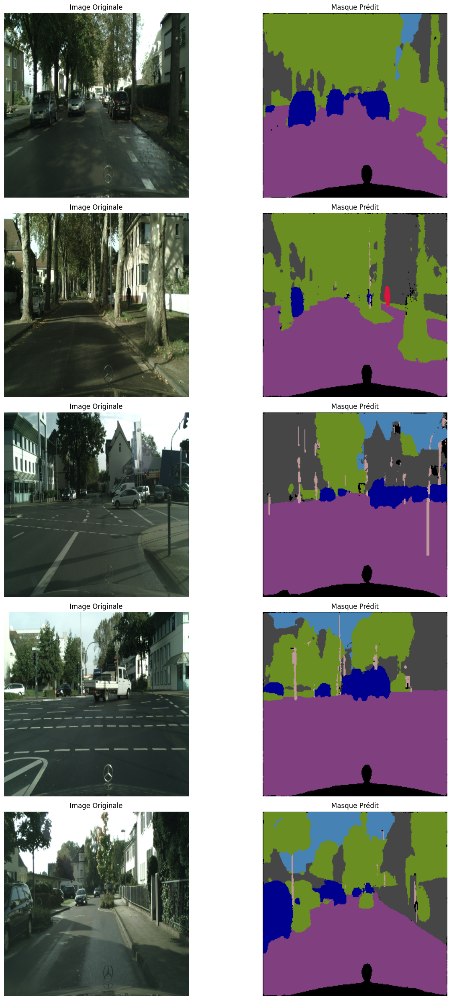

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2
from torch.nn import functional as F
from transformers import SegformerForSemanticSegmentation

# Définir la palette de couleurs pour les classes
PALETTE = np.array([
    [0, 0, 0],        # void : Noir
    [128, 64, 128],   # flat : Violet
    [70, 70, 70],     # construction : Gris foncé
    [190, 153, 153],  # object : Rose clair
    [107, 142, 35],   # nature : Vert
    [70, 130, 180],   # sky : Bleu ciel
    [220, 20, 60],    # human : Rouge
    [0, 0, 142]       # vehicle : Bleu foncé
])

def convert_mask_to_color(mask):
    color_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i in range(8):
        color_mask[mask == i, :] = PALETTE[i]
    return color_mask

# Charger le modèle sauvegardé
model_name = "nvidia/segformer-b0-finetuned-cityscapes-1024-1024"
model_essai = SegformerForSemanticSegmentation.from_pretrained('/content/drive/My Drive/model_segformer_essai')

# Assurez-vous que le modèle est sur le GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_essai.to(device)
model_essai.eval()

# Fonction pour obtenir les chemins des images et des masques
def get_image_and_mask_paths(image_base_dir, mask_base_dir):
    cities = os.listdir(image_base_dir)
    image_paths = []
    mask_paths = []
    for city in cities:
        city_image_dir = os.path.join(image_base_dir, city)
        city_mask_dir = os.path.join(mask_base_dir, city)
        images = os.listdir(city_image_dir)
        for img in images:
            mask = img.replace('_leftImg8bit.png', '_gtFine_labelIds.png')
            mask_path = os.path.join(city_mask_dir, mask)
            if os.path.exists(mask_path):
                image_paths.append(os.path.join(city_image_dir, img))
                mask_paths.append(mask_path)
            else:
                print(f"Mask not found for image: {img}")
    print(f"Total images loaded from {image_base_dir}: {len(image_paths)}")
    print(f"Total masks loaded from {mask_base_dir}: {len(mask_paths)}")
    return image_paths, mask_paths

# Charger les chemins des images de test
test_image_base_dir = '/content/drive/My Drive/data/leftImg8bit/test'
test_mask_base_dir = '/content/drive/My Drive/data/gtFine/test'
test_image_paths, _ = get_image_and_mask_paths(test_image_base_dir, test_mask_base_dir)

# Prétraitement manuel des images
def preprocess_image(img_path):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (1024, 1024))  # Redimensionner à 1024x1024
    image = image.astype(np.float32) / 255.0  # Normaliser les pixels
    image = np.transpose(image, (2, 0, 1))  # Changer de format HWC à CHW
    return torch.tensor(image, dtype=torch.float32)

# Charger les images de test et prétraiter
preprocessed_images = [preprocess_image(img_path) for img_path in test_image_paths[:5]]  # Limiter à 5 images pour la visualisation
x_test_essai = torch.stack(preprocessed_images).to(device)

# Effectuer des inférences
with torch.no_grad():
    logits = model_essai(x_test_essai)
    # Redimensionner les prédictions pour correspondre à la résolution d'origine
    probs = F.softmax(logits.logits, dim=1)
    preds = torch.argmax(probs, dim=1).cpu()

def visualize_predictions(images, predictions, num_examples=5):
    fig, axes = plt.subplots(num_examples, 2, figsize=(15, num_examples * 5))
    axes = axes.ravel()

    for i in range(num_examples):
        # Charger l'image
        img = images[i].cpu().numpy()  # Assurez-vous que les images sont transférées sur le CPU
        img = img.transpose(1, 2, 0)   # Convertir de CxHxW à HxWxC pour la visualisation
        img = (img - img.min()) / (img.max() - img.min())  # Normalisation pour affichage
        pred_mask = convert_mask_to_color(predictions[i].cpu().numpy())  # Transférer les prédictions sur le CPU et convertir

        # Afficher l'image originale
        axes[2*i].imshow(img)
        axes[2*i].set_title("Image Originale")
        axes[2*i].axis('off')

        # Afficher le masque prédit
        axes[2*i + 1].imshow(pred_mask)
        axes[2*i + 1].set_title("Masque Prédit")
        axes[2*i + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualiser des exemples d'images avec leurs masques correspondants
visualize_predictions(x_test_essai, preds, num_examples=5)

SegFormer("nvidia/segformer-b0-finetuned-cityscapes-1024-1024"), Version 2 avec des inputs de dimension: torch.Size(images [8, 3, 512, 512]) torch.Size(masques[8, 512, 512])

Total images loaded from /content/drive/My Drive/data/leftImg8bit/test: 1525
Total masks loaded from /content/drive/My Drive/data/gtFine/test: 1525


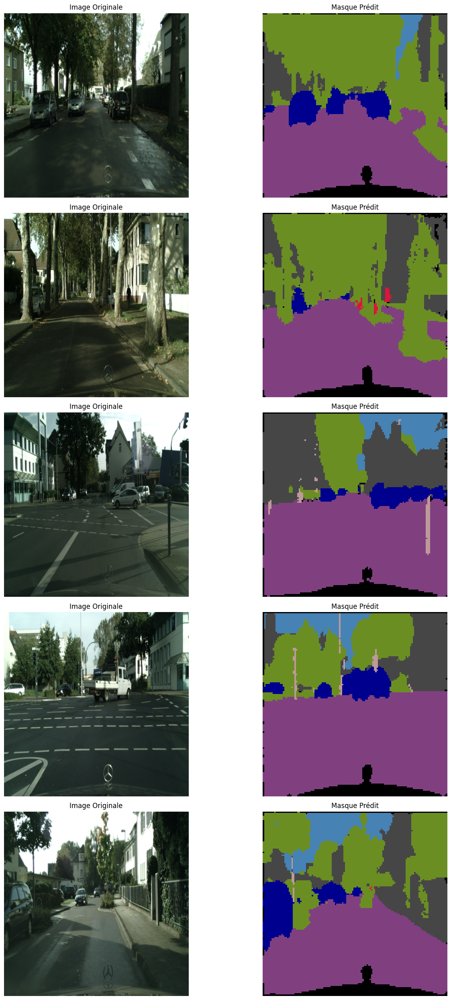

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2
from torch.nn import functional as F
from transformers import SegformerForSemanticSegmentation

# Définir la palette de couleurs pour les classes
PALETTE = np.array([
    [0, 0, 0],        # void : Noir
    [128, 64, 128],   # flat : Violet
    [70, 70, 70],     # construction : Gris foncé
    [190, 153, 153],  # object : Rose clair
    [107, 142, 35],   # nature : Vert
    [70, 130, 180],   # sky : Bleu ciel
    [220, 20, 60],    # human : Rouge
    [0, 0, 142]       # vehicle : Bleu foncé
])

def convert_mask_to_color(mask):
    color_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i in range(8):
        color_mask[mask == i, :] = PALETTE[i]
    return color_mask

# Charger le modèle sauvegardé
model_name = "nvidia/segformer-b0-finetuned-cityscapes-1024-1024"
model_nd = SegformerForSemanticSegmentation.from_pretrained('/content/drive/My Drive/model_segformer')

# Assurez-vous que le modèle est sur le GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model_nd.to(device)
model_nd.eval()

# Fonction pour obtenir les chemins des images et des masques
def get_image_and_mask_paths(image_base_dir, mask_base_dir):
    cities = os.listdir(image_base_dir)
    image_paths = []
    mask_paths = []
    for city in cities:
        city_image_dir = os.path.join(image_base_dir, city)
        city_mask_dir = os.path.join(mask_base_dir, city)
        images = os.listdir(city_image_dir)
        for img in images:
            mask = img.replace('_leftImg8bit.png', '_gtFine_labelIds.png')
            mask_path = os.path.join(city_mask_dir, mask)
            if os.path.exists(mask_path):
                image_paths.append(os.path.join(city_image_dir, img))
                mask_paths.append(mask_path)
            else:
                print(f"Mask not found for image: {img}")
    print(f"Total images loaded from {image_base_dir}: {len(image_paths)}")
    print(f"Total masks loaded from {mask_base_dir}: {len(mask_paths)}")
    return image_paths, mask_paths

# Charger les chemins des images de test
test_image_base_dir = '/content/drive/My Drive/data/leftImg8bit/test'
test_mask_base_dir = '/content/drive/My Drive/data/gtFine/test'
test_image_paths, _ = get_image_and_mask_paths(test_image_base_dir, test_mask_base_dir)

# Prétraitement manuel des images
def preprocess_image(img_path):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (512, 512))  # Redimensionner à 1024x1024
    image = image.astype(np.float32) / 255.0  # Normaliser les pixels
    image = np.transpose(image, (2, 0, 1))  # Changer de format HWC à CHW
    return torch.tensor(image, dtype=torch.float32)

# Charger les images de test et prétraiter
preprocessed_images = [preprocess_image(img_path) for img_path in test_image_paths[:5]]  # Limiter à 5 images pour la visualisation
x_test_nd = torch.stack(preprocessed_images).to(device)

# Effectuer des inférences
with torch.no_grad():
    logits = model_nd(x_test_nd)
    # Redimensionner les prédictions pour correspondre à la résolution d'origine
    probs = F.softmax(logits.logits, dim=1)
    preds = torch.argmax(probs, dim=1).cpu()

def visualize_predictions(images, predictions, num_examples=5):
    fig, axes = plt.subplots(num_examples, 2, figsize=(15, num_examples * 5))
    axes = axes.ravel()

    for i in range(num_examples):
        # Charger l'image
        img = images[i].cpu().numpy()  # Assurez-vous que les images sont transférées sur le CPU
        img = img.transpose(1, 2, 0)   # Convertir de CxHxW à HxWxC pour la visualisation
        img = (img - img.min()) / (img.max() - img.min())  # Normalisation pour affichage
        pred_mask = convert_mask_to_color(predictions[i].cpu().numpy())  # Transférer les prédictions sur le CPU et convertir

        # Afficher l'image originale
        axes[2*i].imshow(img)
        axes[2*i].set_title("Image Originale")
        axes[2*i].axis('off')

        # Afficher le masque prédit
        axes[2*i + 1].imshow(pred_mask)
        axes[2*i + 1].set_title("Masque Prédit")
        axes[2*i + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualiser des exemples d'images avec leurs masques correspondants
visualize_predictions(x_test_nd, preds, num_examples=5)

SegFormer « Nvidia/segformer-b0-finetuned-ade-512-512 »

Total images loaded from /content/drive/My Drive/data/leftImg8bit/test: 1525
Total masks loaded from /content/drive/My Drive/data/gtFine/test: 1525


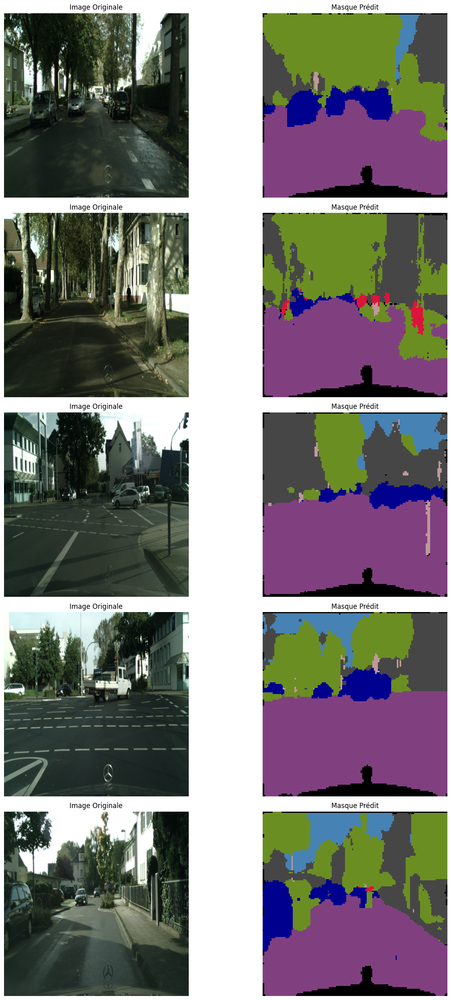

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import torch
import cv2
from torch.nn import functional as F
from transformers import SegformerForSemanticSegmentation

# Définir la palette de couleurs pour les classes
PALETTE = np.array([
    [0, 0, 0],        # void : Noir
    [128, 64, 128],   # flat : Violet
    [70, 70, 70],     # construction : Gris foncé
    [190, 153, 153],  # object : Rose clair
    [107, 142, 35],   # nature : Vert
    [70, 130, 180],   # sky : Bleu ciel
    [220, 20, 60],    # human : Rouge
    [0, 0, 142]       # vehicle : Bleu foncé
])

def convert_mask_to_color(mask):
    color_mask = np.zeros((mask.shape[0], mask.shape[1], 3), dtype=np.uint8)
    for i in range(8):
        color_mask[mask == i, :] = PALETTE[i]
    return color_mask

# Charger le modèle sauvegardé
model_name = "nvidia/segformer-b0-finetuned-ade-512-512"
model = SegformerForSemanticSegmentation.from_pretrained('/content/drive/My Drive/models')

# Assurez-vous que le modèle est sur le GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

# Fonction pour obtenir les chemins des images et des masques
def get_image_and_mask_paths(image_base_dir, mask_base_dir):
    cities = os.listdir(image_base_dir)
    image_paths = []
    mask_paths = []
    for city in cities:
        city_image_dir = os.path.join(image_base_dir, city)
        city_mask_dir = os.path.join(mask_base_dir, city)
        images = os.listdir(city_image_dir)
        for img in images:
            mask = img.replace('_leftImg8bit.png', '_gtFine_labelIds.png')
            mask_path = os.path.join(city_mask_dir, mask)
            if os.path.exists(mask_path):
                image_paths.append(os.path.join(city_image_dir, img))
                mask_paths.append(mask_path)
            else:
                print(f"Mask not found for image: {img}")
    print(f"Total images loaded from {image_base_dir}: {len(image_paths)}")
    print(f"Total masks loaded from {mask_base_dir}: {len(mask_paths)}")
    return image_paths, mask_paths

# Charger les chemins des images de test
test_image_base_dir = '/content/drive/My Drive/data/leftImg8bit/test'
test_mask_base_dir = '/content/drive/My Drive/data/gtFine/test'
test_image_paths, _ = get_image_and_mask_paths(test_image_base_dir, test_mask_base_dir)

# Prétraitement manuel des images
def preprocess_image(img_path):
    image = cv2.imread(img_path)
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (512, 512))  # Redimensionner à 1024x1024
    image = image.astype(np.float32) / 255.0  # Normaliser les pixels
    image = np.transpose(image, (2, 0, 1))  # Changer de format HWC à CHW
    return torch.tensor(image, dtype=torch.float32)

# Charger les images de test et prétraiter
preprocessed_images = [preprocess_image(img_path) for img_path in test_image_paths[:5]]  # Limiter à 5 images pour la visualisation
x_test = torch.stack(preprocessed_images).to(device)

# Effectuer des inférences
with torch.no_grad():
    logits = model(x_test)
    # Redimensionner les prédictions pour correspondre à la résolution d'origine
    probs = F.softmax(logits.logits, dim=1)
    preds = torch.argmax(probs, dim=1).cpu()

def visualize_predictions(images, predictions, num_examples=5):
    fig, axes = plt.subplots(num_examples, 2, figsize=(15, num_examples * 5))
    axes = axes.ravel()

    for i in range(num_examples):
        # Charger l'image
        img = images[i].cpu().numpy()  # Assurez-vous que les images sont transférées sur le CPU
        img = img.transpose(1, 2, 0)   # Convertir de CxHxW à HxWxC pour la visualisation
        img = (img - img.min()) / (img.max() - img.min())  # Normalisation pour affichage
        pred_mask = convert_mask_to_color(predictions[i].cpu().numpy())  # Transférer les prédictions sur le CPU et convertir

        # Afficher l'image originale
        axes[2*i].imshow(img)
        axes[2*i].set_title("Image Originale")
        axes[2*i].axis('off')

        # Afficher le masque prédit
        axes[2*i + 1].imshow(pred_mask)
        axes[2*i + 1].set_title("Masque Prédit")
        axes[2*i + 1].axis('off')

    plt.tight_layout()
    plt.show()

# Visualiser des exemples d'images avec leurs masques correspondants
visualize_predictions(x_test, preds, num_examples=5)

### Feature importance


Les modèles basés sur une architecture Transformers utilisent les mécanismes d’attention pour pondérer l’importance des différentes parties d’une entrée. SegFormer qui utilise un encodeur de type Transformer ne déroge pas à cette règle. Dans ce contexte, les cartes d’attention indiquent comment le modèle accorde son attention aux différentes parties de l’image à travers les différentes couches qui sont 8 pour notre modèle SegFormer. L’analyse des cartes d’attention peut se faire selon une logique locale et globale.
La logique locale c’est lorsque dans les couches inférieures du modèle focalisent leur attention sur les détails fins. Dans notre exemple ci-dessous, c’est particulièrement perceptible au niveau des deux premières couches où l’on constate que l’attention est largement dispersée et couvre de petites zones mais qui sont relativement nombreuses.
Au fur et à mesure qu’on avance dans les couches d’attention et particulièrement lorsque on atteint les couches les plus profondes, la focalisation devient de plus en plus globale. Sur les dernières couches du modèle, ici les couches 7 et 8, l’attention devient plus concentrée sur des zones spécifiques et bien précises.
En réalité, le modèle commence par se concentrer sur les détails fins, l’attention est alors dispersée car le modèle cherche à capturer un maximum d’informations. A mesure qu’il affine son apprentissage, le modèle focalise son attention sur des régions spécifiques de l’image ce qui lui permet de mieux cerner la disposition générale et les relations entre les objets.


Attention Layer 1 shape: torch.Size([1, 1, 65536, 1024])
Attention map shape before reshape: (65536,)
Attention map shape after reshape: (256, 256)
Attention Layer 2 shape: torch.Size([1, 1, 65536, 1024])
Attention map shape before reshape: (65536,)
Attention map shape after reshape: (256, 256)
Attention Layer 3 shape: torch.Size([1, 2, 16384, 1024])
Attention map shape before reshape: (16384,)
Attention map shape after reshape: (128, 128)
Attention Layer 4 shape: torch.Size([1, 2, 16384, 1024])
Attention map shape before reshape: (16384,)
Attention map shape after reshape: (128, 128)
Attention Layer 5 shape: torch.Size([1, 5, 4096, 1024])
Attention map shape before reshape: (4096,)
Attention map shape after reshape: (64, 64)
Attention Layer 6 shape: torch.Size([1, 5, 4096, 1024])
Attention map shape before reshape: (4096,)
Attention map shape after reshape: (64, 64)
Attention Layer 7 shape: torch.Size([1, 8, 1024, 1024])
Attention map shape before reshape: (1024,)
Attention map shape 

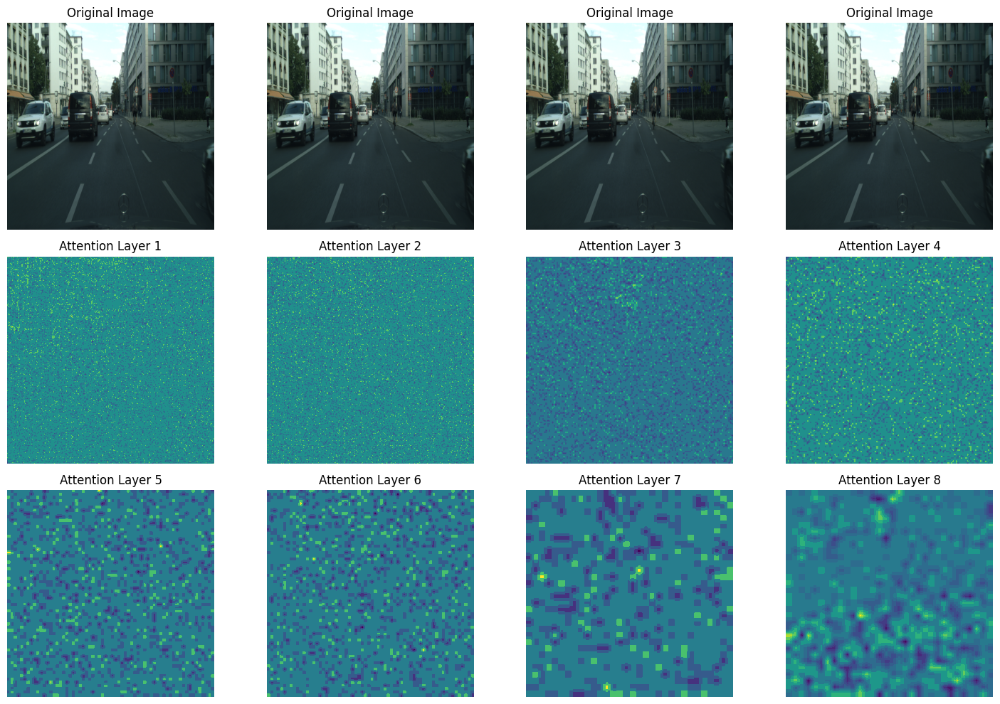

In [10]:
def plot_attention_maps_with_original(image_path, attentions, image_shape=(1024, 1024)):
    image = Image.open(image_path).convert("RGB")
    image = image.resize(image_shape)
    image = np.array(image)

    num_layers = len(attentions)
    num_columns = num_layers // 2 if num_layers % 2 == 0 else num_layers // 2 + 1  # Calculer le nombre de colonnes
    fig, axes = plt.subplots(3, num_columns, figsize=(15, 10))  # Créer une figure avec 3 lignes pour inclure l'image originale

    for i, attention in enumerate(attentions):
        row = (i // num_columns) + 1  # décaler la rangée de 1 pour laisser la première rangée pour l'image originale
        col = i % num_columns
        ax = axes[row, col]

        print(f"Attention Layer {i+1} shape: {attention.shape}")
        # Extraire la première carte d'attention du lot et réduire la dimension des têtes
        attention_map = attention[0, 0].mean(dim=1).detach().cpu().numpy()  # Moyenne sur la dimension des têtes

        # Afficher des informations sur la forme actuelle de la carte d'attention
        print(f"Attention map shape before reshape: {attention_map.shape}")

        # Estimer la taille de la grille
        num_tokens = attention_map.shape[0]
        size = int(np.sqrt(num_tokens))
        if size * size != num_tokens:
            print(f"Skipping layer {i+1} due to non-square token count.")
            continue

        attention_map = attention_map.reshape((size, size))
        print(f"Attention map shape after reshape: {attention_map.shape}")

        attention_map = cv2.resize(attention_map, image_shape)  # Redimensionner à la taille de l'image
        # Afficher la carte d'attention en utilisant un colormap
        ax.imshow(attention_map, cmap='viridis')
        ax.set_title(f"Attention Layer {i+1}")
        ax.axis('off')

    # Afficher l'image originale sur la première ligne
    for col in range(num_columns):
        axes[0, col].imshow(image)
        axes[0, col].set_title("Original Image")
        axes[0, col].axis('off')

    plt.tight_layout()
    plt.show()

# Visualiser les cartes d'attention avec l'image originale
plot_attention_maps_with_original(image_path, attentions)


In [2]:
import torch
from transformers import SegformerModel

# Charger le modèle pré-entraîné
model = SegformerModel.from_pretrained("nvidia/segformer-b0-finetuned-cityscapes-1024-1024")

# Assurez-vous que le modèle est sur le GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

# Vérifiez le nombre de couches d'attention
example_input = torch.randn(1, 3, 1024, 1024).to(device)
with torch.no_grad():
    outputs = model(example_input, output_attentions=True)
    attentions = outputs.attentions

num_layers = len(attentions)
print(f"Nombre de couches d'attention: {num_layers}")


/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/1.68k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/15.0M [00:00<?, ?B/s]

Nombre de couches d'attention: 8


In [3]:
import torch
from transformers import SegformerModel
import matplotlib.pyplot as plt
import numpy as np
from PIL import Image
import cv2

# Charger le modèle pré-entraîné
model = SegformerModel.from_pretrained("nvidia/segformer-b0-finetuned-cityscapes-1024-1024")

# Assurez-vous que le modèle est sur le GPU
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)
model.eval()

# Fonction de prétraitement manuel des images
def preprocess_image(image_path):
    image = Image.open(image_path).convert("RGB")
    image = np.array(image)
    image = cv2.resize(image, (1024, 1024))  # Redimensionner à 1024x1024
    image = image.astype(np.float32) / 255.0  # Normaliser les pixels entre 0 et 1
    image = (image - [0.485, 0.456, 0.406]) / [0.229, 0.224, 0.225]  # Normalisation ImageNet
    image = np.transpose(image, (2, 0, 1))  # Changer de format HWC à CHW
    return torch.tensor(image, dtype=torch.float32).unsqueeze(0)

# Charger et prétraiter l'image
image_path = '/content/drive/My Drive/data/leftImg8bit/test/berlin/berlin_000024_000019_leftImg8bit.png'
image = preprocess_image(image_path).to(device)

# Passer l'image à travers le modèle pour obtenir les cartes d'attention
with torch.no_grad():
    outputs = model(image, output_attentions=True)
    attentions = outputs.attentions  # Liste des cartes d'attention

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


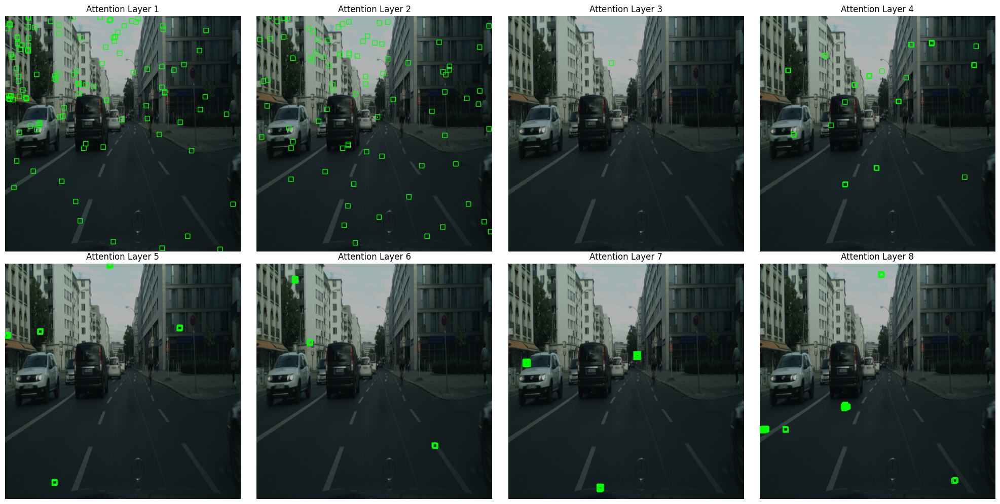

In [6]:
def plot_all_attention_maps(image_path, attentions, image_shape=(1024, 1024)):
    image = Image.open(image_path).convert("RGB")
    image = image.resize(image_shape)
    image = np.array(image)

    num_layers = len(attentions)
    num_columns = 4  # Nombre de colonnes pour une meilleure disposition
    num_rows = (num_layers + num_columns - 1) // num_columns  # Calculer le nombre de lignes nécessaires
    fig, axes = plt.subplots(num_rows, num_columns, figsize=(20, 10))  # Créer une figure avec plusieurs lignes

    for idx, attention in enumerate(attentions):
        row = idx // num_columns
        col = idx % num_columns
        ax = axes[row, col]

        attention_map = attention[0, 0].mean(dim=1).detach().cpu().numpy()  # Moyenne sur la dimension des têtes

        num_tokens = attention_map.shape[0]
        size = int(np.sqrt(num_tokens))
        if size * size != num_tokens:
            continue

        attention_map = attention_map.reshape((size, size))
        attention_map_resized = cv2.resize(attention_map, image_shape)  # Redimensionner à la taille de l'image

        # Normaliser l'attention map pour obtenir des valeurs entre 0 et 1
        attention_map_normalized = (attention_map_resized - attention_map_resized.min()) / (attention_map_resized.max() - attention_map_resized.min())

        # Seuil pour considérer une zone comme une région de haute attention
        threshold = 0.85  # Augmenter le seuil pour réduire le nombre de zones de haute attention
        high_attention_areas = np.argwhere(attention_map_normalized > threshold)

        # Filtrer pour garder uniquement les zones les plus significatives
        high_attention_areas = high_attention_areas[::10]  # Garder une zone sur dix pour réduire la densité

        # Superposer la carte d'attention sur l'image originale
        overlay = cv2.addWeighted(image, 0.7, cv2.applyColorMap((attention_map_resized * 255).astype(np.uint8), cv2.COLORMAP_HOT), 0.3, 0)

        # Dessiner des rectangles autour des zones de haute attention
        for area in high_attention_areas:
            y, x = area
            cv2.rectangle(overlay, (x-10, y-10), (x+10, y+10), (0, 255, 0), 2)

        # Afficher l'image originale avec la carte d'attention superposée
        ax.imshow(overlay)
        ax.set_title(f"Attention Layer {idx+1}")
        ax.axis('off')

    # Supprimer les axes inutilisés si le nombre de couches n'est pas un multiple du nombre de colonnes
    for idx in range(num_layers, num_rows * num_columns):
        fig.delaxes(axes.flatten()[idx])

    plt.tight_layout()
    plt.show()

# Visualiser les cartes d'attention superposées à l'image originale avec des rectangles autour des zones de haute attention
plot_all_attention_maps(image_path, attentions)